In [76]:
# Import the packages for this project

import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None



# Read the data
df = pd.read_csv(r'C:\Users\austi\Downloads\Movies_Revenue_Analysis.csv')

In [77]:
# Look at the data

df.head()

,name,rating,genre,year,released,YearCountry,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",1980 (United States),8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",1980 (United States),5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",1980 (United States),8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",1980 (United States),7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",1980 (United States),7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98


In [78]:
# Look at number of rows and col

df.shape

(5423, 16)

In [79]:
# Look for missing data

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, pct_missing))

name - 0.0%
rating - 0.0%
genre - 0.0%
year - 0.0%
released - 0.0%
YearCountry - 0.0%
score - 0.0%
votes - 0.0%
director - 0.0%
writer - 0.0%
star - 0.0%
country - 0.0%
budget - 0.0%
gross - 0.0%
company - 0.0%
runtime - 0.0%


In [80]:
# Column data types

df.dtypes

name            object
rating          object
genre           object
year             int64
released        object
YearCountry     object
score          float64
votes            int64
director        object
writer          object
star            object
country         object
budget           int64
gross            int64
company         object
runtime          int64
dtype: object

In [83]:
# Refine YearCountry column to reflect public release date instead of the date the movie was completed

df['YearCorrect'] = df['YearCorrect'].astype(str).str[0:4]

df.head

,name,rating,genre,year,released,YearCorrect,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",1980,8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",1980,5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",1980,8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",1980,7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",1980,7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",1980,6.4,123000,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures,95
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",1980,7.9,188000,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures,133
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",1980,8.2,330000,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions,129
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",1981,6.8,101000,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",1980,7.0,10000,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists,100


In [81]:
# Rename Column YearCountry to YearCorrect

df.rename(columns = {'YearCountry':'YearCorrect'}, inplace = True)

In [84]:
df = df.sort_values(by=['gross'], inplace=False, ascending=False)

In [85]:
pd.set_option('display.max_rows', None)

In [31]:
# Drop any duplicates

df['company'].drop_duplicates().sort_values(ascending=False) 

5103                                              thefyzz
3922                                          micro_scope
2553                                             i5 Films
4836                                           i am OTHER
4539                                                 erbp
2375                                       double A Films
2023                          Zucker Brothers Productions
78                                       Zoetrope Studios
1237                                   Zeta Entertainment
2304                              Zentropa Entertainments
625                                  Zenith Entertainment
3523                                      Zazen Produções
714                              Zanuck/Brown Productions
721                           Zacharias-Buhai Productions
435                             Young Sung Production Co.
3477                           Young Hannibal Productions
3782                                          Yellow Bird
3059          

In [37]:
# Data is clean for use now
# Goal: Identify variables that impact gross
# Hypothesis: Company & budget will have a high correlation to gross

(5423, 16)

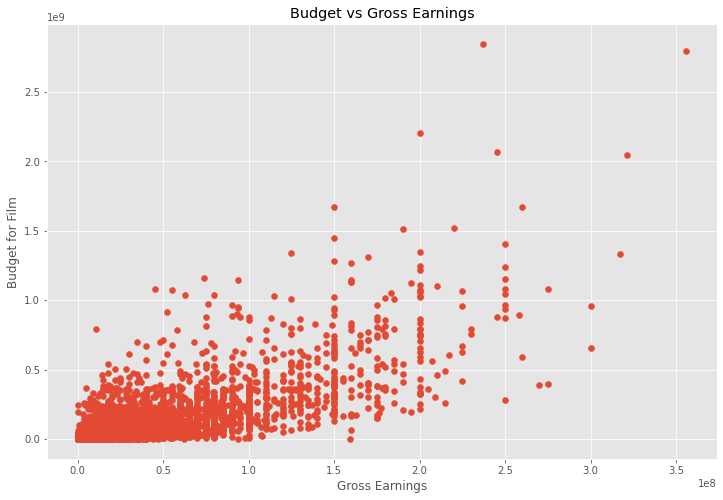

In [72]:
# Scatter plot with budget vs gross

plt.scatter(x=df['budget'], y=df['gross'])

plt.title('Budget vs Gross Earnings')

plt.xlabel('Gross Earnings')

plt.ylabel('Budget for Film')
plt.show()

In [44]:
df.head()

,name,rating,genre,year,released,YearCorrect,score,votes,director,writer,star,country,budget,gross,company,runtime
3733,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",2009,7.8,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162
5304,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",2019,8.4,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181
1797,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",1997,7.8,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194
4732,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",2015,7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138
5160,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",2018,8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149


<AxesSubplot:xlabel='budget', ylabel='gross'>

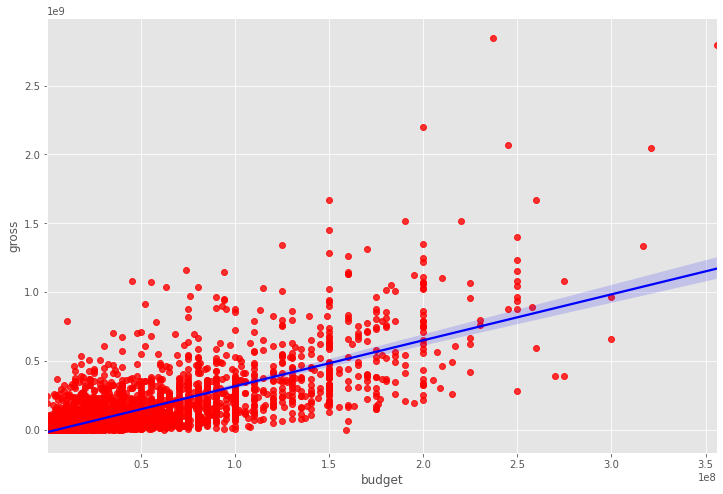

In [46]:
# Plot budget vs gross using seaborn

sns.regplot(x='budget', y='gross', data=df, scatter_kws={"color": "red"}, line_kws={"color":"blue"})

In [51]:
# Looking at correlation

df.corr(method='pearson') # pearson, kendall, spearman

,year,score,votes,budget,gross,runtime
year,1.000000,0.056723,0.206255,0.327973,0.274485,0.075173
score,0.056723,1.000000,0.474328,0.072184,0.222666,0.414145
votes,0.206255,0.474328,1.000000,0.439771,0.614798,0.352331
budget,0.327973,0.072184,0.439771,1.000000,0.740278,0.318718
gross,0.274485,0.222666,0.614798,0.740278,1.000000,0.275830
runtime,0.075173,0.414145,0.352331,0.318718,0.275830,1.000000


In [52]:
# high correlation between budget and gross

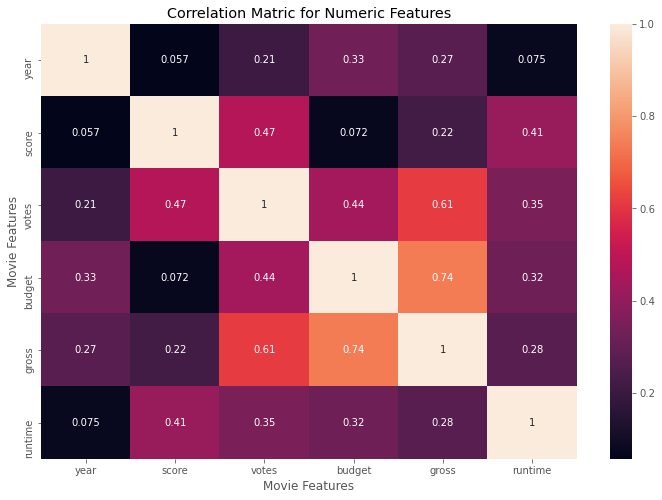

In [54]:
correlation_matrix = df.corr(method='pearson')

sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matric for Numeric Features')


plt.xlabel('Movie Features')

plt.ylabel('Movie Features')

plt.show()



In [56]:
# Company correlation Analysis

df.head()

,name,rating,genre,year,released,YearCorrect,score,votes,director,writer,star,country,budget,gross,company,runtime
3733,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",2009,7.8,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162
5304,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",2019,8.4,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181
1797,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",1997,7.8,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194
4732,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",2015,7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138
5160,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",2018,8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149


In [61]:
df_numeric = df

for col_name in df_numeric.columns:
    if(df_numeric[col_name].dtype == 'object'):
        df_numeric[col_name] = df_numeric[col_name].astype('category')
        df_numeric[col_name] = df_numeric[col_name].cat.codes
        
df_numeric

,name,rating,genre,year,released,YearCorrect,score,votes,director,writer,star,country,budget,gross,company,runtime
3733,386,5,0,2009,527,29,7.8,1100000,785,1263,1533,47,237000000,2847246203,1382,162
5304,388,5,0,2019,137,39,8.4,903000,105,513,1469,47,356000000,2797501328,983,181
1797,4911,5,6,1997,534,17,7.8,1100000,785,1263,1072,47,200000000,2201647264,1382,194
4732,3644,5,0,2015,529,35,7.8,876000,768,1806,355,47,245000000,2069521700,945,138
5160,389,5,0,2018,145,38,8.4,897000,105,513,1469,47,321000000,2048359754,983,149
5336,4390,4,2,2019,1126,39,6.9,222000,1012,1361,456,47,260000000,1670727580,1423,118
4722,2118,5,0,2015,1303,35,7.0,593000,335,2523,292,47,150000000,1670516444,1397,124
4226,3879,5,0,2012,1899,32,8.0,1300000,1060,1646,1469,47,220000000,1518815515,983,143
4715,1541,5,0,2015,165,35,7.1,370000,809,481,1784,47,190000000,1515341399,1397,137
5348,1530,4,2,2019,2053,39,6.8,148000,277,1383,1035,47,150000000,1450026933,1422,103


In [98]:
df.head

<bound method NDFrame.head of                                                    name     rating      genre  \
3733                                             Avatar      PG-13     Action   
5304                                  Avengers: Endgame      PG-13     Action   
1797                                            Titanic      PG-13      Drama   
4732         Star Wars: Episode VII - The Force Awakens      PG-13     Action   
5160                             Avengers: Infinity War      PG-13     Action   
5336                                      The Lion King         PG  Animation   
4722                                     Jurassic World      PG-13     Action   
4226                                       The Avengers      PG-13     Action   
4715                                          Furious 7      PG-13     Action   
5348                                          Frozen II         PG  Animation   
4713                            Avengers: Age of Ultron      PG-13     Action  

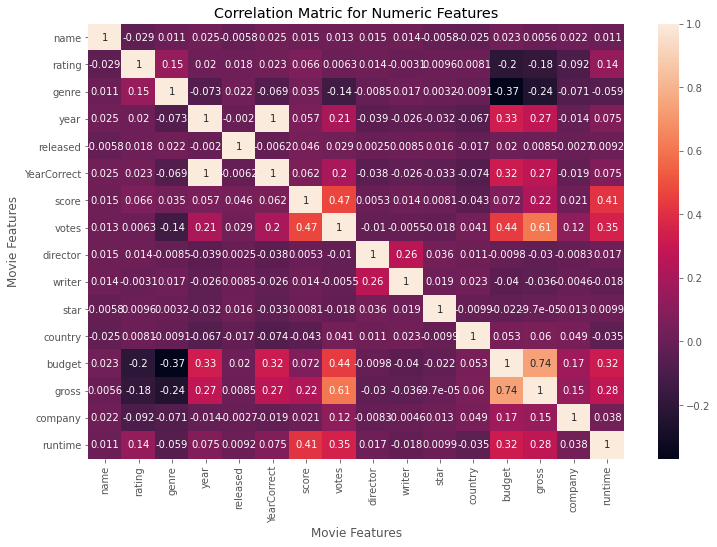

In [87]:
correlation_matrix = df_numeric.corr(method='pearson')

sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matric for Numeric Features')

plt.xlabel('Movie Features')

plt.ylabel('Movie Features')

plt.show()


In [89]:
df_numeric.corr()

,name,rating,genre,year,released,YearCorrect,score,votes,director,writer,star,country,budget,gross,company,runtime
name,1.000000,-0.029267,0.010868,0.025425,-0.005776,0.025424,0.014546,0.012593,0.015319,0.014065,-0.005845,-0.025474,0.023333,0.005620,0.021535,0.010950
rating,-0.029267,1.000000,0.147542,0.020126,0.017994,0.022652,0.066298,0.006306,0.014381,-0.003050,0.009563,0.008075,-0.203528,-0.181606,-0.092245,0.140886
genre,0.010868,0.147542,1.000000,-0.073320,0.021856,-0.069303,0.034871,-0.136069,-0.008505,0.017430,0.003198,-0.009106,-0.368554,-0.244154,-0.071229,-0.059367
year,0.025425,0.020126,-0.073320,1.000000,-0.001957,0.998727,0.056723,0.206255,-0.038682,-0.026467,-0.032319,-0.066902,0.327973,0.274485,-0.014179,0.075173
released,-0.005776,0.017994,0.021856,-0.001957,1.000000,-0.006203,0.046049,0.028779,0.002500,0.008465,0.015764,-0.017199,0.019843,0.008465,-0.002729,0.009172
YearCorrect,0.025424,0.022652,-0.069303,0.998727,-0.006203,1.000000,0.062261,0.203335,-0.037702,-0.026059,-0.032852,-0.073721,0.320568,0.268888,-0.018649,0.075391
score,0.014546,0.066298,0.034871,0.056723,0.046049,0.062261,1.000000,0.474328,0.005299,0.013566,0.008100,-0.043141,0.072184,0.222666,0.020602,0.414145
votes,0.012593,0.006306,-0.136069,0.206255,0.028779,0.203335,0.474328,1.000000,-0.010498,-0.005492,-0.017668,0.041469,0.439771,0.614798,0.118495,0.352331
director,0.015319,0.014381,-0.008505,-0.038682,0.002500,-0.037702,0.005299,-0.010498,1.000000,0.261413,0.036138,0.011208,-0.009815,-0.029663,-0.008337,0.017437
writer,0.014065,-0.003050,0.017430,-0.026467,0.008465,-0.026059,0.013566,-0.005492,0.261413,1.000000,0.018863,0.022637,-0.039803,-0.036090,-0.004610,-0.017726


In [92]:
correlation_mat = df_numeric.corr()

corr_pairs = correlation_mat.unstack()

corr_pairs

name         name           1.000000
             rating        -0.029267
             genre          0.010868
             year           0.025425
             released      -0.005776
             YearCorrect    0.025424
             score          0.014546
             votes          0.012593
             director       0.015319
             writer         0.014065
             star          -0.005845
             country       -0.025474
             budget         0.023333
             gross          0.005620
             company        0.021535
             runtime        0.010950
rating       name          -0.029267
             rating         1.000000
             genre          0.147542
             year           0.020126
             released       0.017994
             YearCorrect    0.022652
             score          0.066298
             votes          0.006306
             director       0.014381
             writer        -0.003050
             star           0.009563
 

In [95]:
sorted_pairs = corr_pairs.sort_values()

sorted_pairs

genre        budget        -0.368554
budget       genre         -0.368554
genre        gross         -0.244154
gross        genre         -0.244154
rating       budget        -0.203528
budget       rating        -0.203528
rating       gross         -0.181606
gross        rating        -0.181606
votes        genre         -0.136069
genre        votes         -0.136069
company      rating        -0.092245
rating       company       -0.092245
country      YearCorrect   -0.073721
YearCorrect  country       -0.073721
genre        year          -0.073320
year         genre         -0.073320
company      genre         -0.071229
genre        company       -0.071229
             YearCorrect   -0.069303
YearCorrect  genre         -0.069303
country      year          -0.066902
year         country       -0.066902
genre        runtime       -0.059367
runtime      genre         -0.059367
country      score         -0.043141
score        country       -0.043141
budget       writer        -0.039803
w

In [97]:
high_corr = sorted_pairs[(sorted_pairs) > 0.5]

high_corr

gross        votes          0.614798
votes        gross          0.614798
budget       gross          0.740278
gross        budget         0.740278
YearCorrect  year           0.998727
year         YearCorrect    0.998727
name         name           1.000000
gross        gross          1.000000
budget       budget         1.000000
country      country        1.000000
star         star           1.000000
writer       writer         1.000000
director     director       1.000000
votes        votes          1.000000
score        score          1.000000
YearCorrect  YearCorrect    1.000000
released     released       1.000000
year         year           1.000000
genre        genre          1.000000
rating       rating         1.000000
company      company        1.000000
runtime      runtime        1.000000
dtype: float64

In [ ]:
# Votes and budget have the highest correlation to gross earnings
# company has low correlation